# <u><h1 style="color: red;background-color: yellow;">1)Importing All Libraries We Require</h1><u><br></br>

In [1]:
import numpy as np
import pandas as pd
import re
import requests
from bs4 import BeautifulSoup

import matplotlib.pyplot as plt
import seaborn as sns

import time

import warnings
warnings.filterwarnings('ignore')



from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [2]:
df = pd.read_csv(r'C:\Users\HP\Data science with Python\02) web scrapping\cleaned_df.csv')

In [3]:
df

,Unnamed: 0,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,0,The Godfather,1972,175,"Crime, Drama",9.2,228221,14.67,0,0,1,1,0,0,0,0,0,0,0
1,1,Goodfellas,1990,146,"Biography, Crime, Drama",8.7,379413,353.01,0,0,1,1,0,0,0,0,0,1,0
2,2,Pulp Fiction,1994,154,"Crime, Drama",8.9,83526,10.00,0,0,1,1,0,0,0,0,0,0,0
3,3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27234,0.05,0,0,1,1,0,0,0,1,0,0,0
4,4,Apocalypse Now,1979,147,"Drama, Mystery, War",8.4,407182,46.89,0,0,1,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
901,901,Blade II,2002,117,"Action, Horror, Sci-Fi",6.7,210883,82.35,1,1,0,0,0,0,1,0,0,0,0
902,902,Falling Down,1993,113,"Action, Crime, Drama",7.6,183097,40.90,1,0,1,1,0,0,0,0,0,0,0
903,903,Eyes Wide Shut,1999,159,"Drama, Mystery, Thriller",7.4,324924,55.69,0,0,1,0,0,1,0,1,0,0,0
904,904,The Lost Boys,1987,97,"Comedy, Horror",7.3,135899,32.22,0,1,0,0,1,0,0,0,0,0,0


In [4]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 906 entries, 0 to 905
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Title              906 non-null    object 
 1   Year of Release    906 non-null    int64  
 2   Duration in min    906 non-null    int64  
 3   Genre              906 non-null    object 
 4   Rating             906 non-null    float64
 5   Votes in Views     906 non-null    int64  
 6   Gross in Millions  906 non-null    float64
 7   Action             906 non-null    int64  
 8   Horror             906 non-null    int64  
 9   Drama              906 non-null    int64  
 10  Crime              906 non-null    int64  
 11  Comedy             906 non-null    int64  
 12  Thriller           906 non-null    int64  
 13  Sci-Fi             906 non-null    int64  
 14  Mystery            906 non-null    int64  
 15  Adventure          906 non-null    int64  
 16  Biography          906 non

# EDA

### Here comes the plotting part

***1.Question is which plot is better for visualization***

***2.From that what info we get?***

***3.Finally what we conclude from that plot?***

# <u><h1 style="color: blue;background-color: white;">I)UNI-VARIATE ANALYSIS</h1><u><br></br>

* Countplot(cat)
* pieplot(cat)
* distplot(num)
* histogram(num)
* boxplot(num)

# <u><h1 style="color: blue;background-color: white;">i)Count Plot on Rating Column</h1><u><br></br>

In [8]:
dy = df.nlargest(500,'Year of Release')
dd = df.nlargest(600,'Duration in min')
dr = df.nlargest(300,'Rating')
dv = df.nlargest(300,'Votes in Views')
dg = df.nlargest(300,'Gross in Millions')

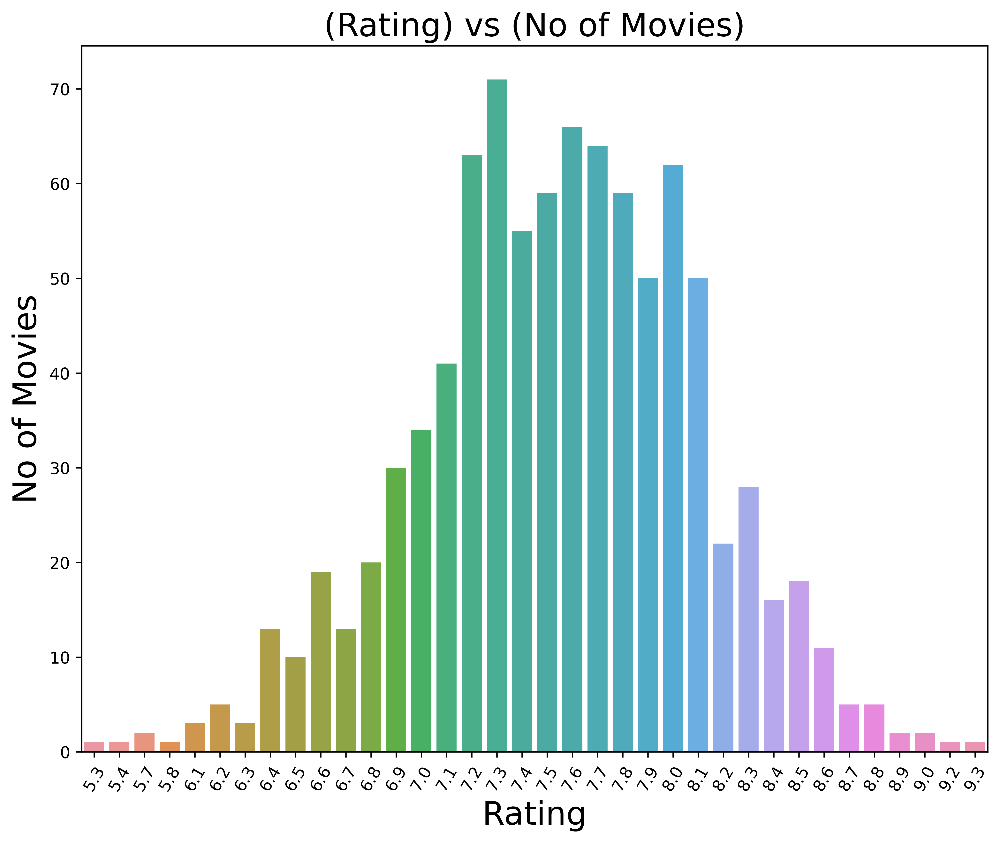

In [9]:
plt.figure(figsize=(10,8),dpi=600)
sns.countplot(data = df,x = 'Rating')
plt.xticks(rotation = 60)
plt.xlabel('Rating',fontsize=20)
plt.ylabel('No of Movies',fontsize=20)
plt.title('(Rating) vs (No of Movies)',fontsize=20);

## From the above plot most of the movies has rating of 7.3 and those movies are code below.

In [10]:
df[df['Rating']==7.3].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
88,Men in Black,1997,98,"Action, Adventure, Comedy",7.3,210883,82.35
112,Natural Born Killers,1994,118,"Action, Crime, Drama",7.3,26362,6.71
118,The General,1998,124,"Biography, Crime, Drama",7.3,161357,46.96
127,Gremlins,1984,106,"Comedy, Fantasy, Horror",7.3,46976,2.65
132,Borat: Cultural Learnings of America for Make ...,2006,84,Comedy,7.3,371094,209.84
...,...,...,...,...,...,...,...
853,Fast Five,2011,130,"Action, Crime, Thriller",7.3,371094,209.84
858,Rocky II,1979,119,"Drama, Sport",7.3,202545,6.39
892,Detroit,2017,143,"Crime, Drama, History",7.3,51966,16.79
897,The Edge of Seventeen,2016,104,"Comedy, Drama",7.3,118235,14.43


# <u><h1 style="color: blue;background-color: white;">ii)Count Plot on Year of Release Column</h1><u><br></br>

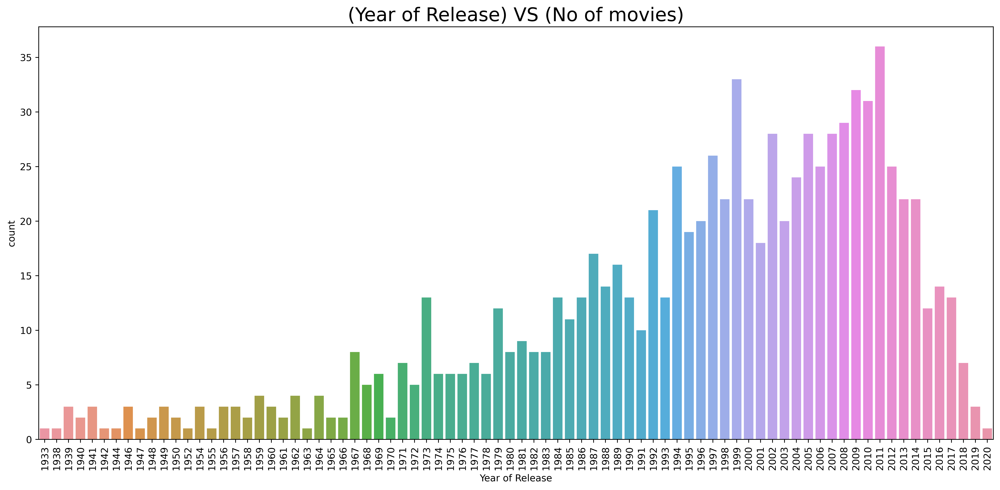

In [11]:
plt.figure(figsize=(18,8),dpi=600)
sns.countplot(data = df,x = 'Year of Release')
plt.xticks(rotation = 90)
plt.title('(Year of Release) VS (No of movies)',fontsize=20);

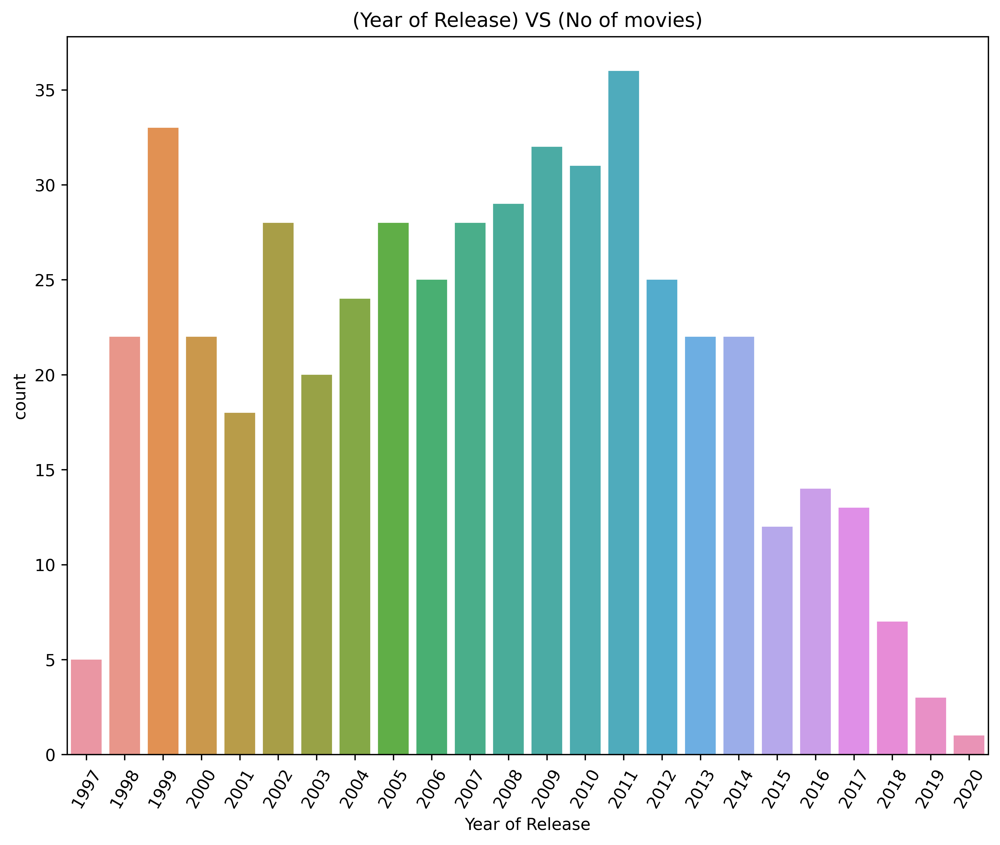

In [12]:
plt.figure(figsize=(10,8),dpi=600)
sns.countplot(data = dy,x = 'Year of Release')
plt.xticks(rotation = 60)
plt.title('(Year of Release) VS (No of movies)');

### From the above plot most of the movies has released on year 2011 and those movies are code below.

In [13]:
df[df['Year of Release']==2011].loc[:,'Title':'Gross in Millions']
len(df[df['Year of Release']==2011])

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
189,Serbuan maut,2011,101,"Action, Crime, Thriller",7.6,83526,10.00
197,Hugo,2011,126,"Adventure, Drama, Family",7.5,201349,8.75
221,Shame,2011,101,Drama,7.2,431679,66.26
236,La piel que habito,2011,120,"Drama, Horror, Thriller",7.6,210528,44.54
279,Rise of the Planet of the Apes,2011,105,"Action, Drama, Sci-Fi",7.5,228221,14.67
280,Moneyball,2011,133,"Biography, Drama, Sport",7.6,379413,353.01
283,Hodejegerne,2011,96,"Action, Crime, Thriller",7.5,135727,52.10
310,Mission: Impossible - Ghost Protocol,2011,132,"Action, Adventure, Thriller",7.4,21985,1.91
323,Rango,2011,107,"Animation, Action, Adventure",7.2,18159,32.48
344,50/50,2011,100,"Comedy, Drama, Romance",7.6,334328,0.27


36

# <u><h1 style="color: blue;background-color: white;">iii)Count Plot on Genre Column</h1><u><br></br>

In [14]:
plt.figure(figsize=(100,20),dpi=600)
sns.countplot(data = df,x ='Genre')
plt.xticks(rotation = 90);

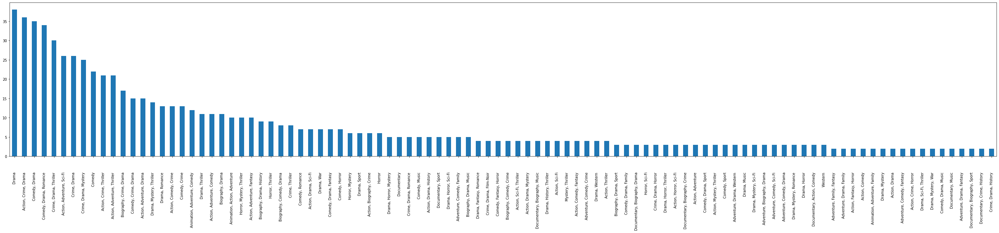

In [15]:
df['Genre'].value_counts().nlargest(100).plot(kind = 'bar',figsize=(50,8));

In [16]:
plt.figure(figsize=(50,8),dpi=600)
sns.countplot(data = df,x = 'Genre')
plt.xticks(rotation = 90)
plt.xlabel('Genre',loc='left',fontsize=20)
plt.ylabel('No of Movies',fontsize=20)
plt.title('(Genre) vs (No of Movies)',loc='left',fontsize=20);

### From the above plot most of the movies has based on Drama genre and those movies are code below.

In [17]:
df[df['Drama']==1].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
0,The Godfather,1972,175,"Crime, Drama",9.2,228221,14.67
1,Goodfellas,1990,146,"Biography, Crime, Drama",8.7,379413,353.01
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,83526,10.00
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27234,0.05
4,Apocalypse Now,1979,147,"Drama, Mystery, War",8.4,407182,46.89
...,...,...,...,...,...,...,...
897,The Edge of Seventeen,2016,104,"Comedy, Drama",7.3,118235,14.43
898,Molly's Game,2017,140,"Biography, Crime, Drama",7.4,160781,28.78
900,A Star Is Born,2018,136,"Drama, Music, Romance",7.6,365407,215.29
902,Falling Down,1993,113,"Action, Crime, Drama",7.6,183097,40.90


# <u><h1 style="color: blue;background-color: white;">iv-a)Count Plot on Gross in Millions Column</h1><u><br></br>

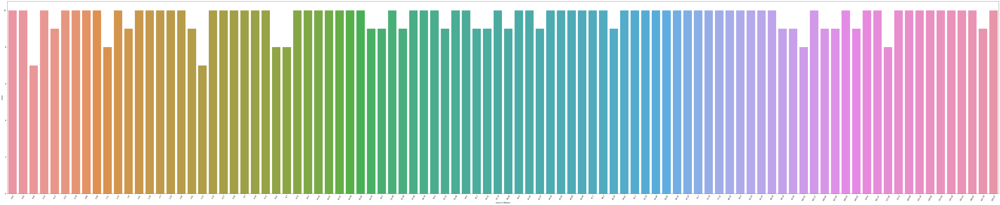

In [18]:
plt.figure(figsize=(100,20))
sns.countplot(data = df,x ='Gross in Millions')
plt.xticks(rotation = 60);
# from this we can't say most of the movies got how much collection, plot is some what confusing.
# In this case we used Histogram

# <u><h1 style="color: blue;background-color: white;">iv-b)Histogram on Gross in Millions Column</h1><u><br></br>

###  For this we took highest and lowest gross value in the dataframe to know the range values


In [19]:
df.nlargest(1,'Gross in Millions')
df.nsmallest(1,'Gross in Millions')

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
33,The Truman Show,1998,103,"Comedy, Drama",8.1,642835,424.67,0,0,1,0,1,0,0,0,0,0,0


,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
47,Being John Malkovich,1999,113,"Comedy, Drama, Fantasy",7.7,3794,0.01,0,0,1,0,1,0,0,0,0,0,0


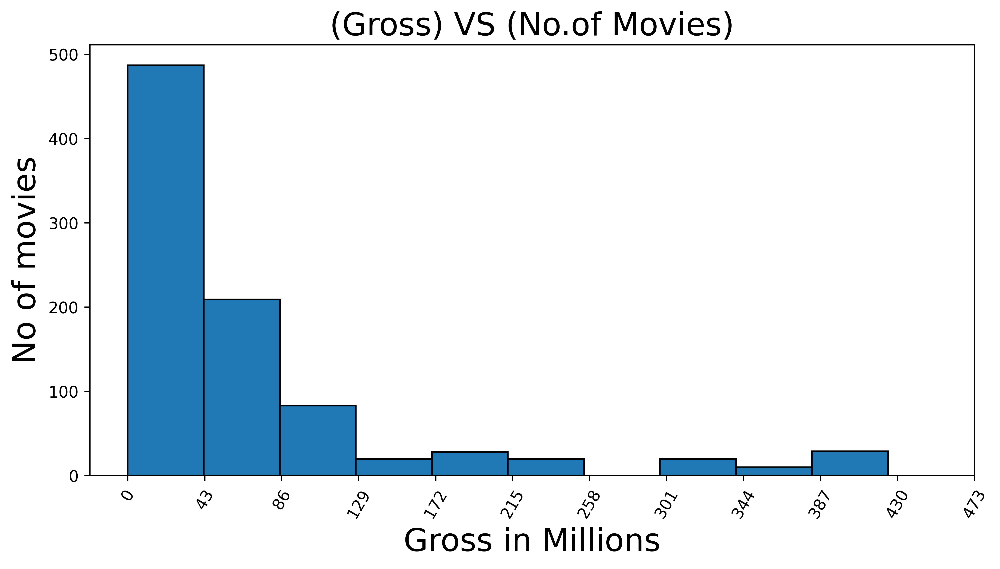

In [20]:
plt.figure(figsize=(10,5),dpi=600)
plt.hist(data = df,x ='Gross in Millions',edgecolor='black')
plt.xticks(np.arange(0,500,43),rotation = 60)
plt.xlabel('Gross in Millions',fontsize=20)
plt.ylabel('No of movies',fontsize=20)
plt.title('(Gross) VS (No.of Movies)',fontsize=20);

### From the above plot most of the movies has its collection upto 43millions and those movies are code below.


In [21]:
df[df['Gross in Millions']<=43].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
0,The Godfather,1972,175,"Crime, Drama",9.2,228221,14.67
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,83526,10.00
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27234,0.05
6,Fight Club,1999,139,Drama,8.8,83271,16.31
7,Boogie Nights,1997,155,Drama,7.9,29696,0.96
...,...,...,...,...,...,...,...
897,The Edge of Seventeen,2016,104,"Comedy, Drama",7.3,118235,14.43
898,Molly's Game,2017,140,"Biography, Crime, Drama",7.4,160781,28.78
899,Free Fire,2016,91,"Action, Comedy, Crime",6.4,45679,1.80
902,Falling Down,1993,113,"Action, Crime, Drama",7.6,183097,40.90


# <u><h1 style="color: blue;background-color: white;">v-a)Countplot on Votes in Views Column</h1><u><br></br>

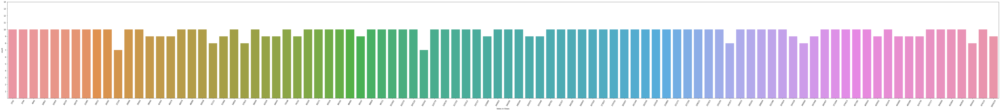

In [22]:
plt.figure(figsize=(100,10))
sns.countplot(data = df,x = 'Votes in Views')
plt.xticks(rotation = 60)
plt.yticks(np.arange(1,15));

# from this we can't say most of the movies got how much Votes, plot is some what confusing.
# In this case we used Histogram

# <u><h1 style="color: blue;background-color: white;">v-b)Histogram on Votes in Views Column</h1><u><br></br>

###  For this Histogram we are checking the least and highest value for giving range

In [23]:
df.nlargest(1,'Votes in Views')
df.nsmallest(1,"Votes in Views")

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
64,Blue Velvet,1986,120,"Crime, Drama, Mystery",7.7,1004214,422.78,0,0,1,1,0,0,0,1,0,0,0


,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
42,Chinatown,1974,130,"Drama, Mystery, Thriller",8.2,2762,0.51,0,0,1,0,0,1,0,1,0,0,0


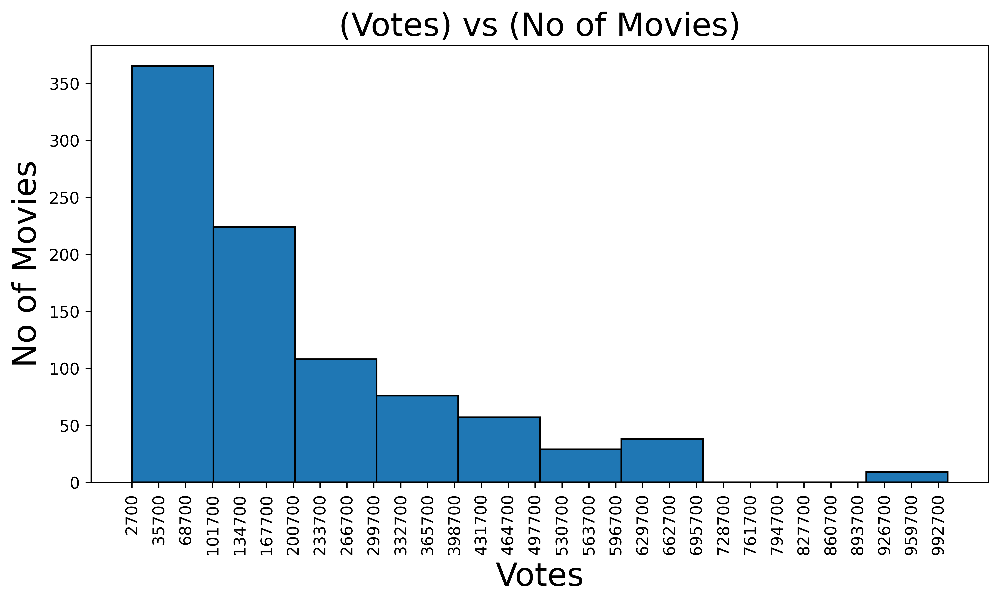

In [24]:
plt.figure(figsize=(10,5),dpi=600)
plt.hist(data = df,x = 'Votes in Views',edgecolor='black')
plt.xticks(np.arange(2700,1004300,33000),rotation = 90)
plt.xlabel('Votes',fontsize=20)
plt.ylabel('No of Movies',fontsize=20)
plt.title('(Votes) vs (No of Movies)',fontsize=20);

### From the above plot we observe that most of the views are in between 2762 and 102700 and those movies are code below.

In [25]:
df[df['Votes in Views']<=101700].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,83526,10.00
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27234,0.05
6,Fight Club,1999,139,Drama,8.8,83271,16.31
7,Boogie Nights,1997,155,Drama,7.9,29696,0.96
13,Back to the Future,1985,116,"Adventure, Comedy, Sci-Fi",8.5,73548,4.56
...,...,...,...,...,...,...,...
878,Fletch,1985,98,"Comedy, Crime, Mystery",6.9,50938,50.61
880,Sleeper,1973,89,"Comedy, Sci-Fi",7.2,42493,2.91
892,Detroit,2017,143,"Crime, Drama, History",7.3,51966,16.79
896,Dear Zachary: A Letter to a Son About His Father,2008,95,"Documentary, Biography, Crime",8.5,35693,0.02


# <u><h1 style="color: blue;background-color: white;">vi)Count plot on Duration in min Column</h1><u><br></br>

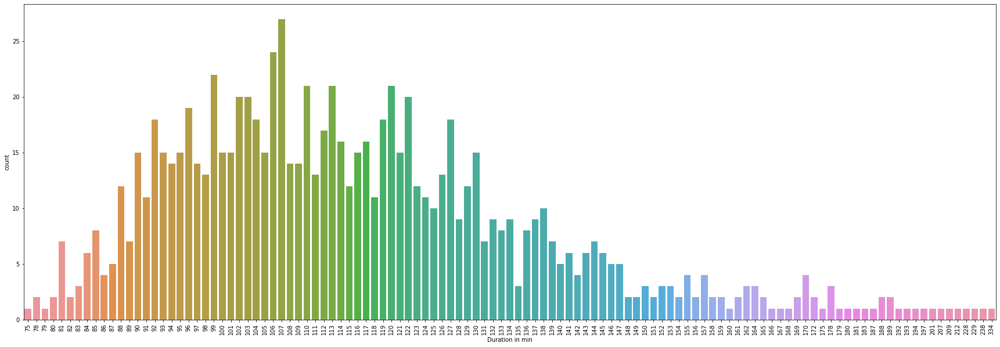

In [26]:
plt.figure(figsize=(30,10))
sns.countplot(data = df,x = 'Duration in min')
plt.xticks(rotation = 90);

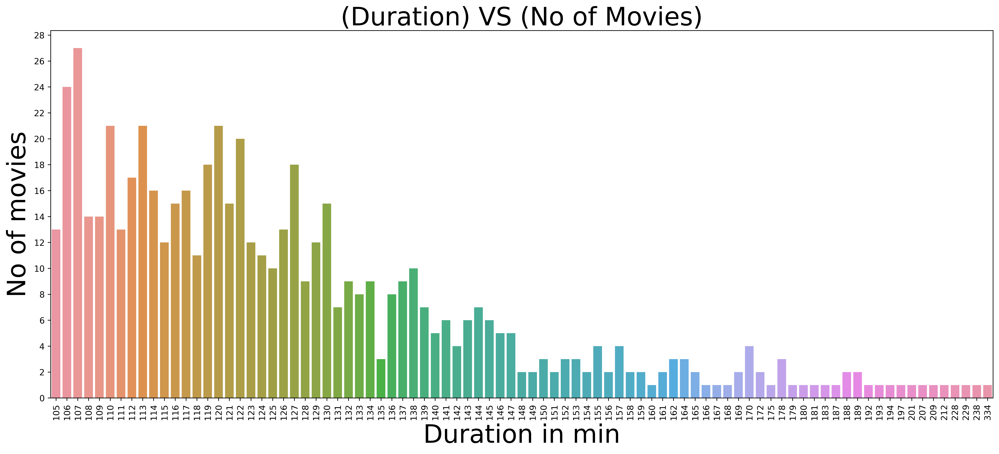

In [27]:
plt.figure(figsize=(20,8),dpi=600)
sns.countplot(data = dd,x = 'Duration in min')
plt.xticks(rotation = 90)
plt.yticks(np.arange(0,30,2))
plt.xlabel('Duration in min',fontsize=30)
plt.ylabel('No of movies',fontsize=30)
plt.title('(Duration) VS (No of Movies)',fontsize=30);

### From the above plot comparatively most of the movies has time duration of 107minutes and those movies are code below.

In [28]:
df[df['Duration in min']==107].loc[:,'Title':'Gross in Millions']
len(df[df['Duration in min']==107])

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
32,"Lock, Stock and Two Smoking Barrels",1998,107,"Action, Comedy, Crime",8.2,21985,1.91
95,The Terminator,1984,107,"Action, Sci-Fi",8.0,83526,10.00
143,"O Brother, Where Art Thou?",2000,107,"Adventure, Comedy, Crime",7.7,210528,44.54
145,Dumb and Dumber,1994,107,Comedy,7.3,88485,37.74
158,In Bruges,2008,107,"Comedy, Crime, Drama",7.9,1004214,422.78
164,The Sixth Sense,1999,107,"Drama, Mystery, Thriller",8.1,594069,218.82
198,Sunshine,2007,107,"Sci-Fi, Thriller",7.2,102575,2.24
215,Grosse Pointe Blank,1997,107,"Action, Comedy, Crime",7.3,48089,0.23
278,Field of Dreams,1989,107,"Drama, Family, Fantasy",7.5,537177,324.59
284,This Is the End,2013,107,Comedy,6.6,83271,16.31


27

# <u><h1 style="color: blue;background-color: white;">II)BI-VARIATE ANALYSIS</h1><u><br></br>

1. BOX PLOT
2. BAR PLOT                 
3. VOILIN PLOT 

# <u><h1 style="color: blue;background-color: white;">i)Bar Graphs for Gross in Millions and Action Movies</h1><u><br></br>

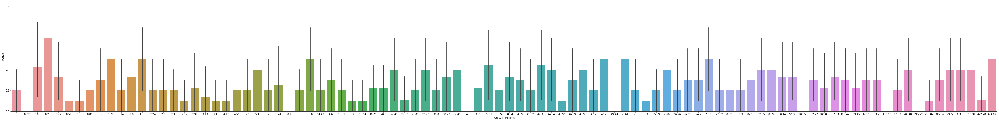

In [29]:
plt.figure(figsize=(70,8))
sns.barplot(x='Gross in Millions',y='Action',data=df)
plt.show();

# <u><h1 style="color: blue;background-color: white;">ii)Bar Graphs for Gross in Millions and Thriller Movies</h1><u><br></br>

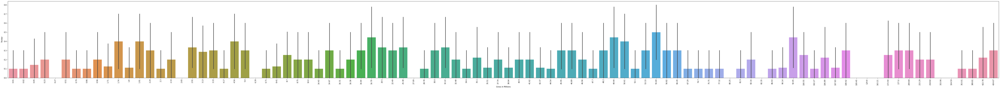

In [30]:
plt.figure(figsize=(100,8))
sns.barplot(x='Gross in Millions',y='Thriller',data=df)
plt.xticks(rotation =90)
plt.show();

# <u><h1 style="color: blue;background-color: white;">iii)Bar Graphs for Gross in Millions and Horror Movies</h1><u><br></br>

In [31]:
df1 = df.nlargest(30,"Gross in Millions")

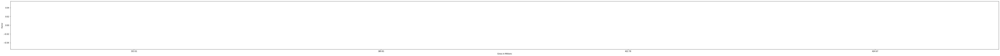

In [32]:
plt.figure(figsize=(100,5))
sns.barplot(x='Gross in Millions',y='Horror',data=df1)
plt.show();

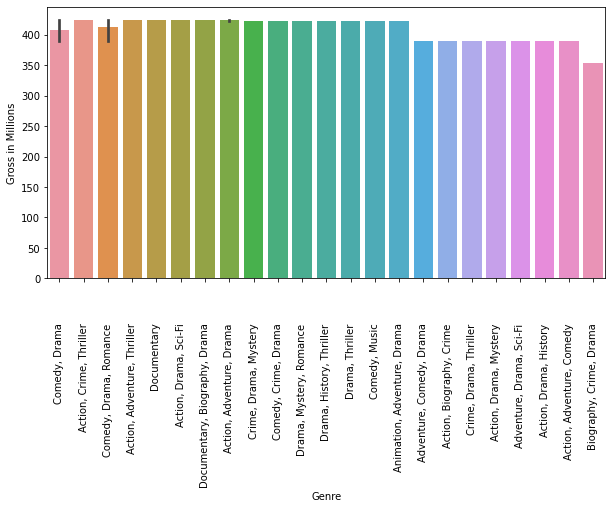

In [33]:
plt.figure(figsize=(10,5))
sns.barplot(x='Genre',y='Gross in Millions',data=df1)
plt.xticks(rotation =90)
plt.show();

   # `VIOLIN PLOTS`

### `Violin plot for [Action,Drama,Comedy] vs Votes in Views`

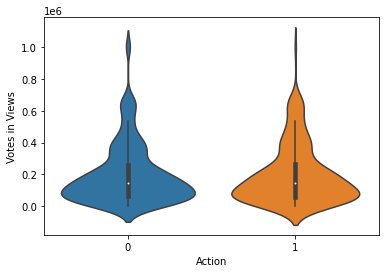

In [34]:
sns.violinplot(df['Action'],df['Votes in Views'])
plt.show();

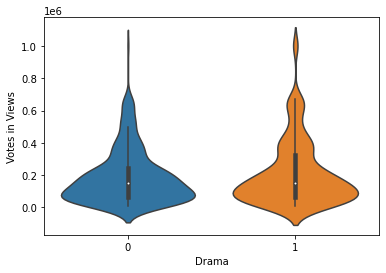

In [35]:
sns.violinplot(df['Drama'],df['Votes in Views'])
plt.show();

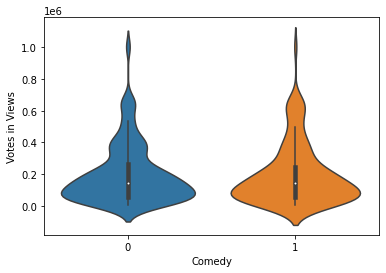

In [36]:
sns.violinplot(df['Comedy'],df['Votes in Views'])
plt.show();

### `Box-Plot for all Genres vs Gross in Millions`

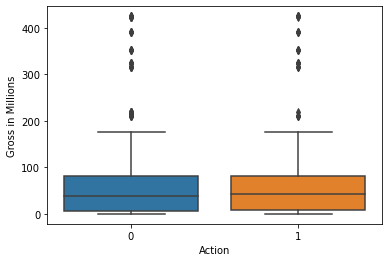

In [37]:
sns.boxplot(df["Action"],df["Gross in Millions"])
plt.show();

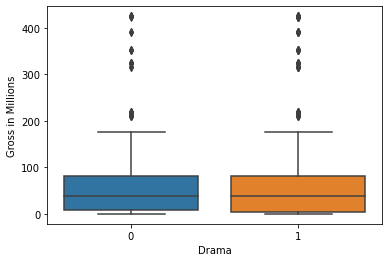

In [38]:
sns.boxplot(df["Drama"],df["Gross in Millions"])
plt.show();

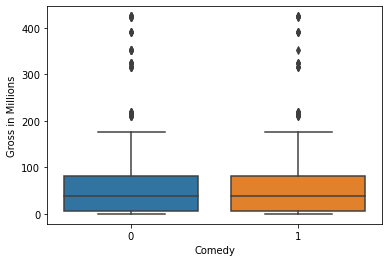

In [39]:
sns.boxplot(df["Comedy"],df["Gross in Millions"])
plt.show();

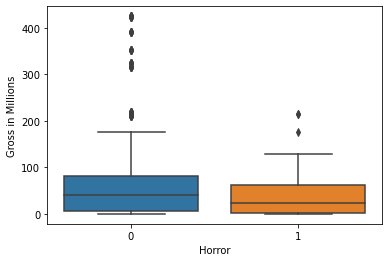

In [40]:
sns.boxplot(df["Horror"],df["Gross in Millions"])
plt.show();

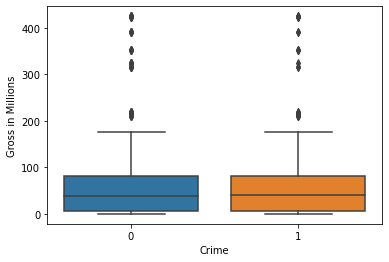

In [41]:
sns.boxplot(df["Crime"],df["Gross in Millions"])
plt.show();

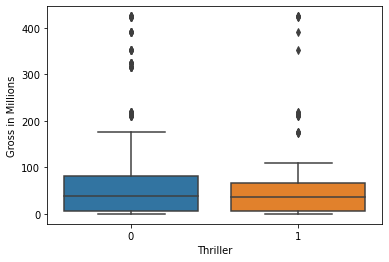

In [42]:
sns.boxplot(df["Thriller"],df["Gross in Millions"])
plt.show();

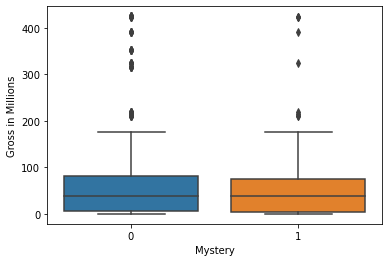

In [43]:
sns.boxplot(df["Mystery"],df["Gross in Millions"])
plt.show();

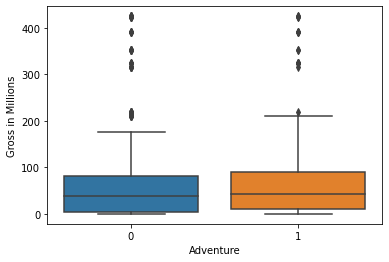

In [44]:
sns.boxplot(df["Adventure"],df["Gross in Millions"])
plt.show();

# <u><h1 style="color: blue;background-color: white;">Bar Plots for all Genres and Gross in Millions</h1><u><br></br>

In [45]:
df.head(1)

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,The Godfather,1972,175,"Crime, Drama",9.2,228221,14.67,0,0,1,1,0,0,0,0,0,0,0


<AxesSubplot:xlabel='Action'>

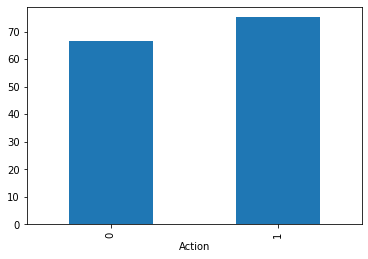

In [46]:
df.groupby(["Action"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Drama'>

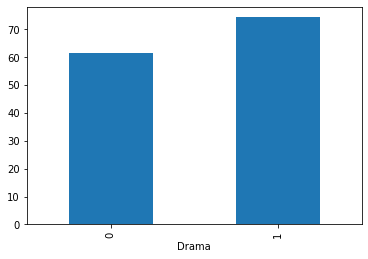

In [47]:
df.groupby(["Drama"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Mystery'>

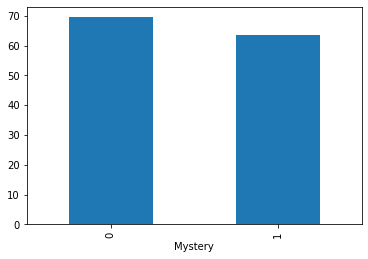

In [48]:
df.groupby(["Mystery"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Horror'>

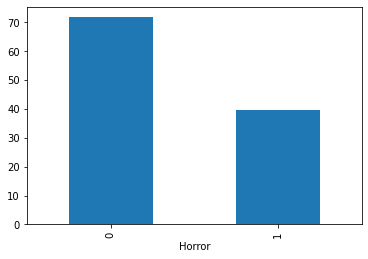

In [49]:
df.groupby(["Horror"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Crime'>

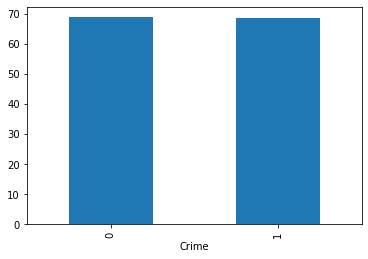

In [50]:
df.groupby(["Crime"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Comedy'>

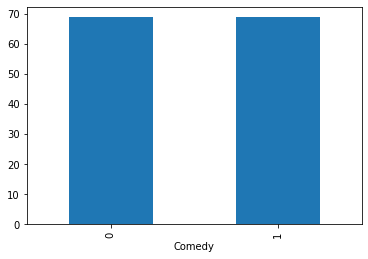

In [51]:
df.groupby(["Comedy"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Thriller'>

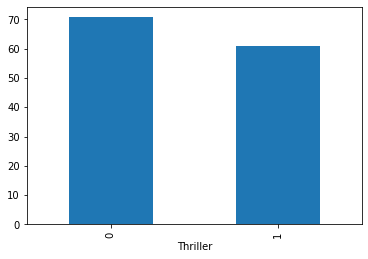

In [52]:
df.groupby(["Thriller"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Adventure'>

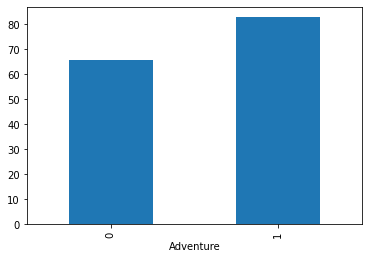

In [53]:
df.groupby(["Adventure"])["Gross in Millions"].mean().plot(kind="bar")

# <u><h1 style="color: blue;background-color: white;">Finally we are checking the gross collection on an average for all the genres</h1><u><br></br> 

In [54]:
df.groupby(['Action'])['Gross in Millions'].mean()

Action
0    66.636373
1    75.150847
Name: Gross in Millions, dtype: float64

In [55]:
df.groupby(['Comedy'])['Gross in Millions'].mean()

Comedy
0    68.848006
1    68.869508
Name: Gross in Millions, dtype: float64

In [56]:
df.groupby(['Drama'])['Gross in Millions'].mean()

Drama
0    61.683308
1    74.347817
Name: Gross in Millions, dtype: float64

In [57]:
df.groupby(['Crime'])['Gross in Millions'].mean()

Crime
0    68.910668
1    68.715649
Name: Gross in Millions, dtype: float64

In [58]:
df.groupby(['Horror'])['Gross in Millions'].mean()

Horror
0    71.786112
1    39.783133
Name: Gross in Millions, dtype: float64

In [59]:
df.groupby(['Thriller'])['Gross in Millions'].mean()

Thriller
0    70.704278
1    60.959477
Name: Gross in Millions, dtype: float64

In [60]:
df.groupby(['Mystery'])['Gross in Millions'].mean()

Mystery
0    69.516865
1    63.453131
Name: Gross in Millions, dtype: float64

In [61]:
df.groupby(['Adventure'])['Gross in Millions'].mean()

Adventure
0    65.699756
1    82.813473
Name: Gross in Millions, dtype: float64

# <u><h1 style="color: blue;background-color: white;">Results below for the on an average collection for all the genres</h1><u><br></br>

1. Adventure = 82.81M
2. Action = 75.15M
3. Drama = 74.34M
4. Crime = 0,1 = 69.80M
5. Comedy = 0,1 = 68.86M
6. Thriller = 60.95M
7. Mystery = 63.45M
8. Horror = 39.78M

# <u><h1 style="color: blue;background-color: white;">Now we are plotting for all Genres vs Rating</h1><u><br></br>

# Bar plot on Genre vs Rating

<AxesSubplot:xlabel='Drama'>

Drama
0    7.446056
1    7.624172
Name: Rating, dtype: float64

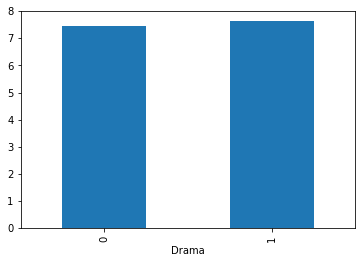

In [62]:
df.groupby(['Drama'])['Rating'].mean().plot(kind='bar')
df.groupby(['Drama'])['Rating'].mean()

<AxesSubplot:xlabel='Comedy'>

Comedy
0    7.620872
1    7.367045
Name: Rating, dtype: float64

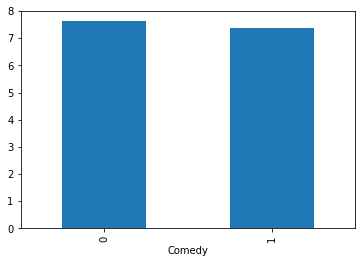

In [63]:
df.groupby(['Comedy'])['Rating'].mean().plot(kind='bar')
df.groupby(['Comedy'])['Rating'].mean()

<AxesSubplot:xlabel='Crime'>

Crime
0    7.551708
1    7.535115
Name: Rating, dtype: float64

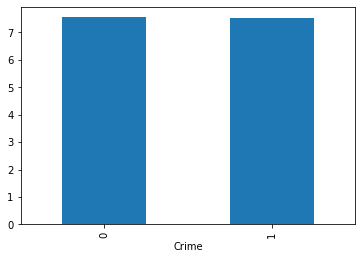

In [64]:
df.groupby(['Crime'])['Rating'].mean().plot(kind='bar')
df.groupby(['Crime'])['Rating'].mean()

<AxesSubplot:xlabel='Action'>

Action
0    7.565075
1    7.495339
Name: Rating, dtype: float64

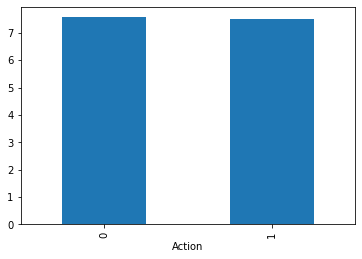

In [65]:
df.groupby(['Action'])['Rating'].mean().plot(kind='bar')
df.groupby(['Action'])['Rating'].mean()

<AxesSubplot:xlabel='Horror'>

Horror
0    7.579101
1    7.227711
Name: Rating, dtype: float64

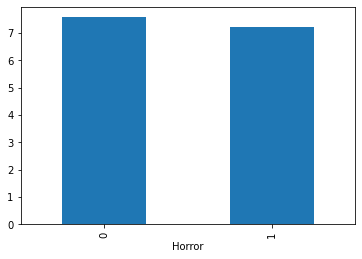

In [66]:
df.groupby(['Horror'])['Rating'].mean().plot(kind='bar')
df.groupby(['Horror'])['Rating'].mean()

<AxesSubplot:xlabel='Thriller'>

Thriller
0    7.578065
1    7.413953
Name: Rating, dtype: float64

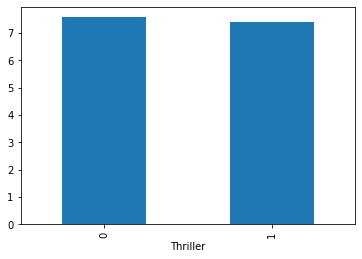

In [67]:
df.groupby(['Thriller'])['Rating'].mean().plot(kind='bar')
df.groupby(['Thriller'])['Rating'].mean()

<AxesSubplot:xlabel='Mystery'>

Mystery
0    7.533705
1    7.654545
Name: Rating, dtype: float64

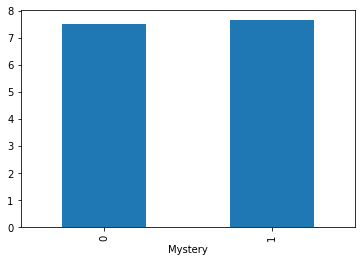

In [68]:
df.groupby(['Mystery'])['Rating'].mean().plot(kind='bar')
df.groupby(['Mystery'])['Rating'].mean()

<AxesSubplot:xlabel='Adventure'>

Adventure
0    7.525304
1    7.642515
Name: Rating, dtype: float64

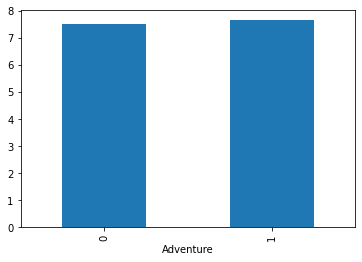

In [69]:
df.groupby(['Adventure'])['Rating'].mean().plot(kind='bar')
df.groupby(['Adventure'])['Rating'].mean()

# <u><h1 style="color: blue;background-color: white;">Now we are plotting for all Genres vs Votes in Views</h1><u><br></br>

# Bar plot on Genre vs Votes in Views

<AxesSubplot:xlabel='Drama'>

Drama
0    185123.099237
1    207933.315789
Name: Votes in Views, dtype: float64

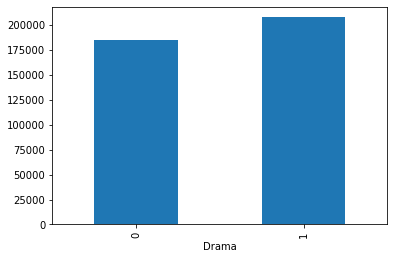

In [70]:
df.groupby(['Drama'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Drama'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Comedy'>

Comedy
0    198912.884735
1    195913.246212
Name: Votes in Views, dtype: float64

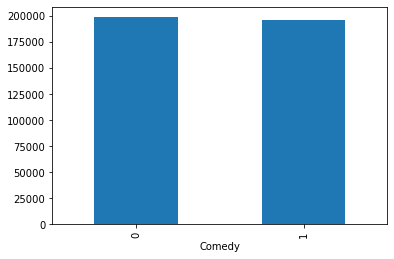

In [71]:
df.groupby(['Comedy'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Comedy'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Crime'>

Crime
0    200096.894410
1    192980.034351
Name: Votes in Views, dtype: float64

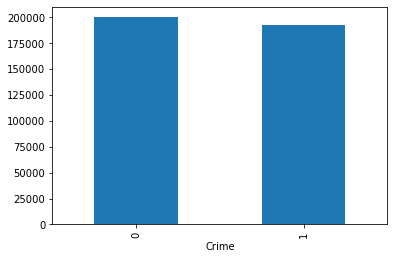

In [72]:
df.groupby(['Crime'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Crime'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Action'>

Action
0    198452.489552
1    196864.411017
Name: Votes in Views, dtype: float64

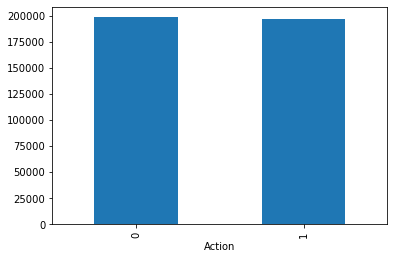

In [73]:
df.groupby(['Action'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Action'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Horror'>

Horror
0    202472.547995
1    154075.445783
Name: Votes in Views, dtype: float64

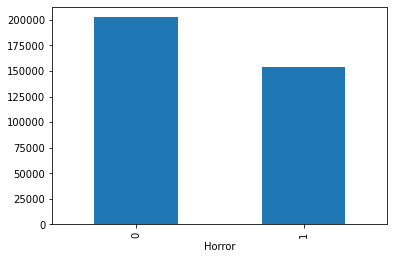

In [74]:
df.groupby(['Horror'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Horror'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Thriller'>

Thriller
0    198449.628065
1    196285.709302
Name: Votes in Views, dtype: float64

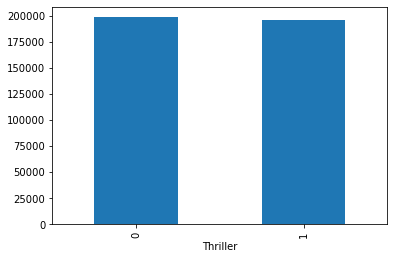

In [75]:
df.groupby(['Thriller'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Thriller'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Mystery'>

Mystery
0    197098.583643
1    205703.151515
Name: Votes in Views, dtype: float64

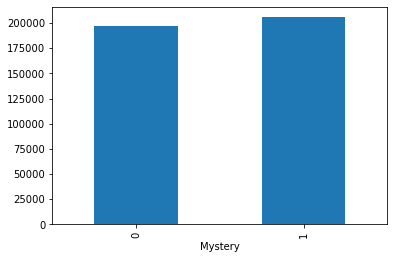

In [76]:
df.groupby(['Mystery'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Mystery'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Adventure'>

Adventure
0    194537.384303
1    213533.185629
Name: Votes in Views, dtype: float64

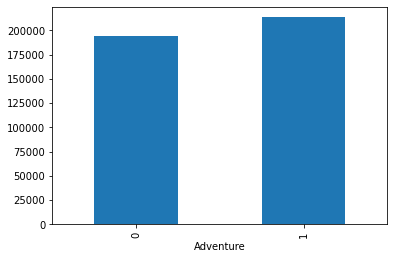

In [77]:
df.groupby(['Adventure'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Adventure'])['Votes in Views'].mean()

# <u><h1 style="color: blue;background-color: white;">III)MULTI-VARIATE ANALYSIS </h1><u><br></br>

# Heat Map 

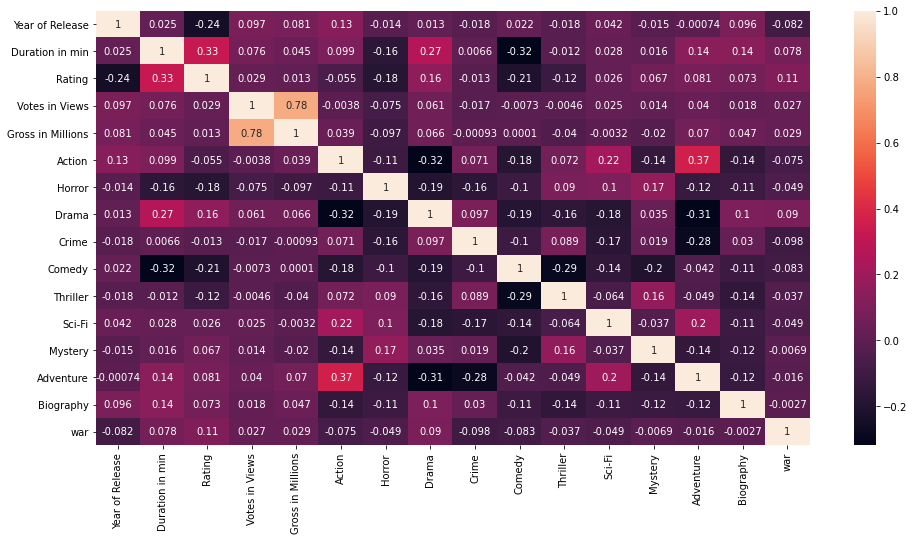

In [78]:
plt.figure(figsize=(16,8))
sns.heatmap(df.corr(),annot= True,linecolor='c');

## 1.RATINGS & GROSS IN MILLIONS FOR ACTION MOVIES

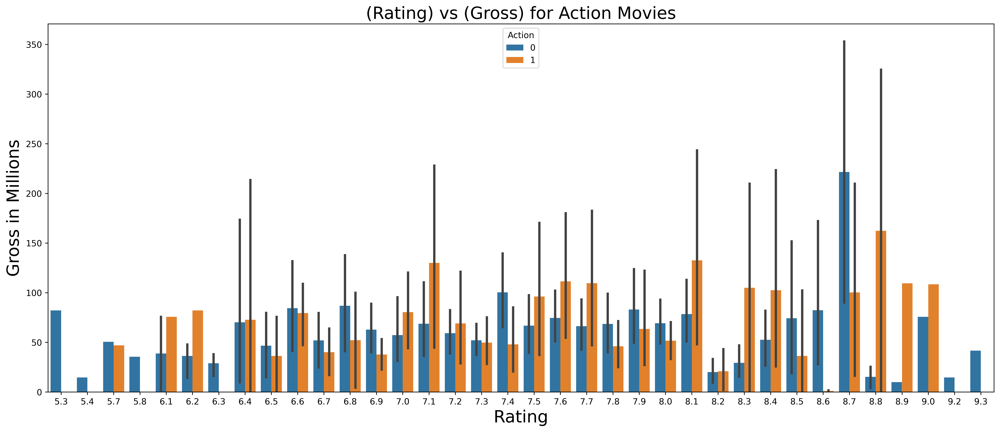

In [79]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Action')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Action Movies',fontsize=20);

### ` From the above plot,Action Movies with Highest Gross above 80M.`

In [80]:
df[(df['Rating']==8.8)&(df['Action']==1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
92,Inception,2010,148,"Action, Adventure, Sci-Fi",8.8,537177,324.59,1,0,0,0,0,0,1,0,1,0,0
96,The Lord of the Rings: The Fellowship of the Ring,2001,178,"Action, Adventure, Drama",8.8,27234,0.05,1,0,1,0,0,0,0,0,1,0,0


---

# 2.RATINGS & GROSS IN MILLIONS FOR HORROR MOVIES

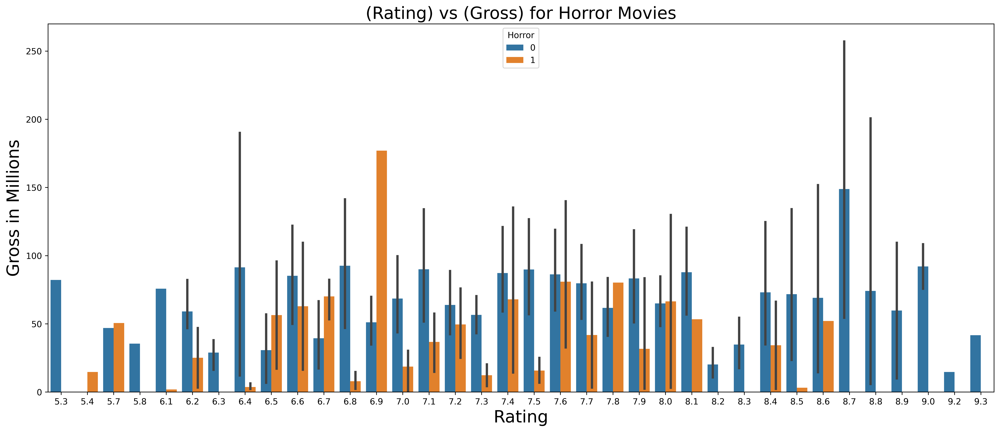

In [81]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Horror')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Horror Movies',fontsize=20);

### `From the above plot,Horror Movies are with Highest Rating 6.9.`

In [82]:
df[(df['Rating']==6.9)&(df['Horror']==1)].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
204,28 Weeks Later,2007,100,"Horror, Sci-Fi",6.9,322186,177.0


---

# 3.RATINGS & GROSS IN MILLIONS FOR DRAMA MOVIES

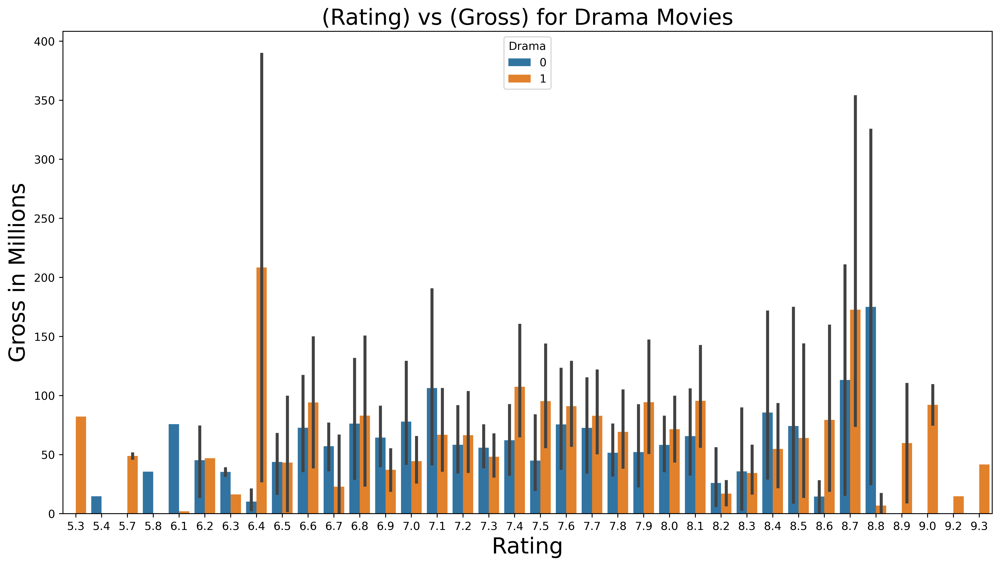

In [83]:
plt.figure(figsize=(15,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Drama')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Drama Movies',fontsize=20);

### `From the above plot,Drama Movies are with Highest Rating 6.4.`

In [84]:
df[(df['Rating']==6.4)&(df['Drama']==1)].head(3)

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
549,Choke,2008,92,"Comedy, Drama",6.4,324924,55.69,0,0,1,0,1,0,0,0,0,0,0
553,The Rover,2014,103,"Action, Crime, Drama",6.4,379413,353.01,1,0,1,1,0,0,0,0,0,0,0
631,Crash,1996,100,Drama,6.4,35693,0.02,0,0,1,0,0,0,0,0,0,0,0


---

# 4.RATINGS & GROSS IN MILLIONS FOR CRIME MOVIES

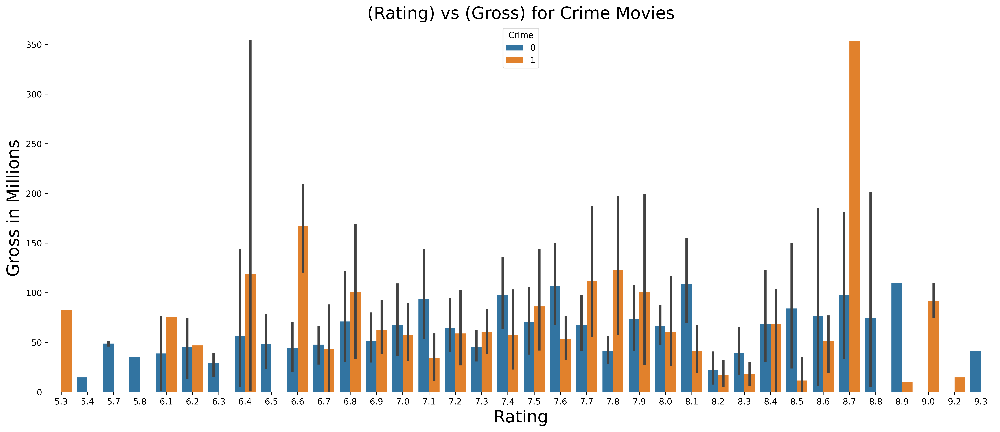

In [85]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Crime')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Crime Movies',fontsize=20);

### `From the above plot,Crime Movies are with Highest Rating 8.7.`

In [86]:
df[(df['Rating']==8.7)&(df['Crime']==1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
1,Goodfellas,1990,146,"Biography, Crime, Drama",8.7,379413,353.01,0,0,1,1,0,0,0,0,0,1,0


---

# 5.RATINGS & GROSS IN MILLIONS FOR COMEDY MOVIES :-

In [87]:

plt.figure(figsize=(20,10),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Comedy')
plt.xticks(rotation = 90)
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Comedy Movies',fontsize=20);

### `From the above plot,Comedy Movies are with Highest Rating 7.9` 

In [88]:
df[(df['Rating']==7.9)&(df['Comedy']==1)]
len(df[(df['Rating']==7.9)&(df['Comedy']==1)])

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
73,Toy Story 2,1999,92,"Animation, Adventure, Comedy",7.9,221271,163.21,0,0,0,0,1,0,0,0,1,0,0
80,Almost Famous,2000,122,"Adventure, Comedy, Drama",7.9,631854,389.81,0,0,1,0,1,0,0,0,1,0,0
158,In Bruges,2008,107,"Comedy, Crime, Drama",7.9,1004214,422.78,0,0,1,1,1,0,0,0,0,0,0
219,Harold and Maude,1971,91,"Comedy, Drama, Romance",7.9,642835,424.67,0,0,1,0,1,0,0,0,0,0,0
276,Fantastic Mr. Fox,2009,87,"Animation, Adventure, Comedy",7.9,324924,55.69,0,0,0,0,1,0,0,0,1,0,0
361,Shaun of the Dead,2004,99,"Comedy, Horror",7.9,35693,0.02,0,1,0,0,1,0,0,0,0,0,0
380,Sing Street,2016,106,"Comedy, Drama, Music",7.9,201349,8.75,0,0,1,0,1,0,0,0,0,0,0
412,American Movie,1999,107,"Documentary, Comedy",7.9,19078,5.00,0,0,0,0,1,0,0,0,0,0,0
495,His Girl Friday,1940,92,"Comedy, Drama, Romance",7.9,46976,2.65,0,0,1,0,1,0,0,0,0,0,0
744,Manhattan,1979,96,"Comedy, Drama, Romance",7.9,173837,3.33,0,0,1,0,1,0,0,0,0,0,0


15

---

# 6.RATINGS & GROSS IN MILLIONS FOR THRILLER MOVIES

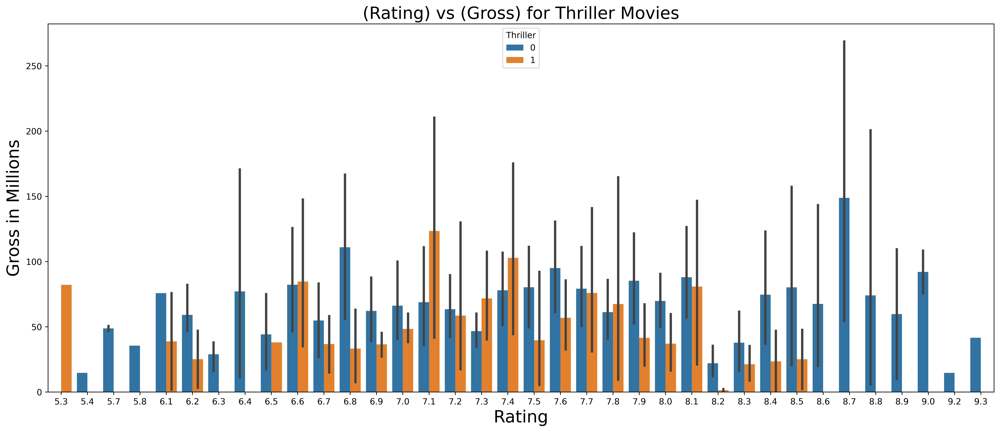

In [89]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Thriller')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Thriller Movies',fontsize=20);

### `From the above plot,Thriller Movies are with Highest Rating 7.1`

In [90]:
df[(df['Thriller']==1)&(df['Rating']==7.1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
241,Day of the Dead,1985,101,"Horror, Thriller",7.1,409563,56.82,0,1,0,0,0,1,0,0,0,0,0
277,The Mist,2007,126,"Horror, Sci-Fi, Thriller",7.1,135899,32.22,0,1,0,0,0,1,1,0,0,0,0
311,Mission: Impossible,1996,110,"Action, Adventure, Thriller",7.1,642835,424.67,1,0,0,0,0,1,0,0,1,0,0
362,The Spy Who Loved Me,1977,125,"Action, Adventure, Thriller",7.1,118235,14.43,1,0,0,0,0,1,0,0,1,0,0
408,Tinker Tailor Soldier Spy,2011,122,"Drama, Mystery, Thriller",7.1,371094,209.84,0,0,1,0,0,1,0,1,0,0,0
506,Bad Lieutenant,1992,96,"Crime, Drama, Thriller",7.1,62026,42.37,0,0,1,1,0,1,0,0,0,0,0
695,Margin Call,2011,107,"Drama, Thriller",7.1,95547,49.44,0,0,1,0,0,1,0,0,0,0,0
773,Hard Candy,2005,104,"Drama, Thriller",7.1,148344,1.74,0,0,1,0,0,1,0,0,0,0,0
817,Fast & Furious 7,2015,137,"Action, Thriller",7.1,379413,353.01,1,0,0,0,0,1,0,0,0,0,0
873,Runaway Jury,2003,127,"Crime, Drama, Thriller",7.1,95547,49.44,0,0,1,1,0,1,0,0,0,0,0


---

# 7.RATINGS & GROSS IN MILLIONS FOR SCI-FI MOVIES

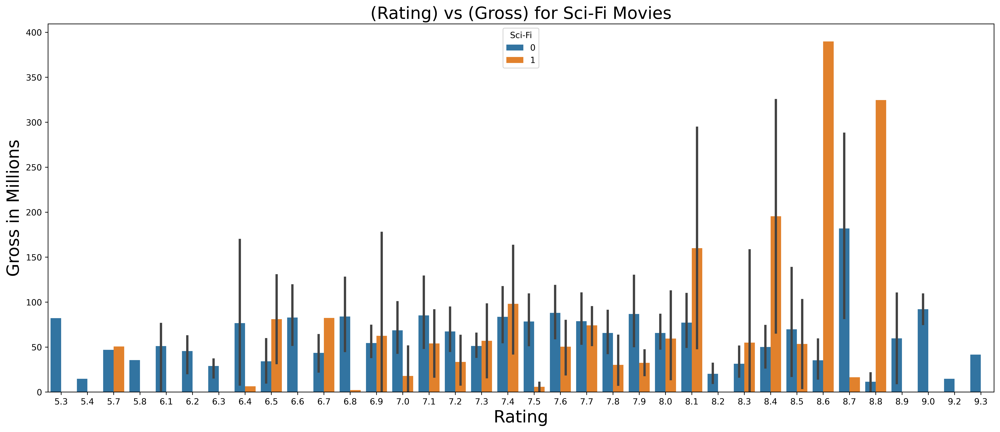

In [91]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Sci-Fi')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Sci-Fi Movies',fontsize=20);

### `From the above plot,Sc--Fi Movies are with Highest Rating 8.6` 

In [92]:
df[(df['Sci-Fi']==1)&(df['Rating']==8.6)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
628,Interstellar,2014,169,"Adventure, Drama, Sci-Fi",8.6,631854,389.81,0,0,1,0,0,0,1,0,1,0,0


---

# 8.RATINGS & GROSS IN MILLIONS FOR MYSTERY MOVIES

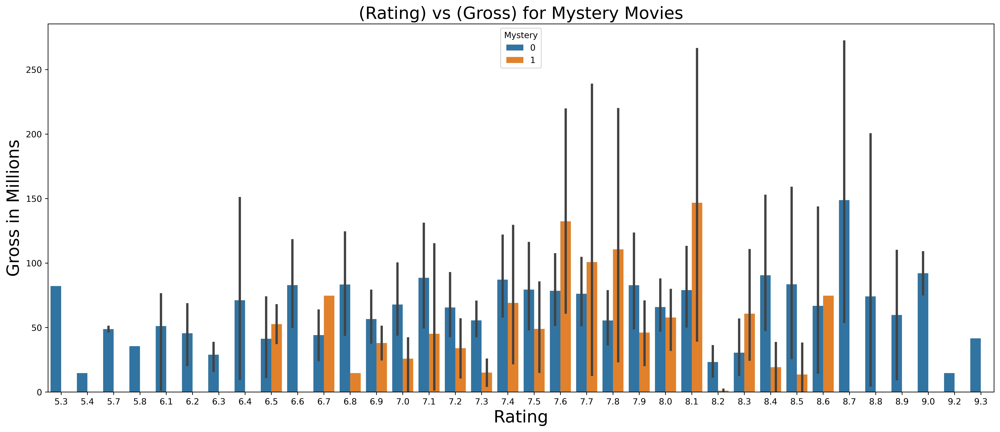

In [93]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Mystery')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Mystery Movies',fontsize=20);

### `From the above plot,Mystery Movies are with Highest Rating 8.1`

In [94]:
df[(df['Mystery']==1)&(df['Rating']==8.1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
62,The Thing,1982,109,"Horror, Mystery, Sci-Fi",8.1,244633,53.33,0,1,0,0,0,0,1,1,0,0,0
164,The Sixth Sense,1999,107,"Drama, Mystery, Thriller",8.1,594069,218.82,0,0,1,0,0,1,0,1,0,0,0
251,Trois couleurs: Rouge,1994,99,"Drama, Mystery, Romance",8.1,1004214,422.78,0,0,1,0,0,0,0,1,0,0,0
295,The Third Man,1949,104,"Film-Noir, Mystery, Thriller",8.1,322186,177.00,0,0,0,0,0,1,0,1,0,0,0
339,Salinui chueok,2003,131,"Crime, Drama, Mystery",8.1,86162,4.17,0,0,1,1,0,0,0,1,0,0,0
698,Prisoners,2013,153,"Crime, Drama, Mystery",8.1,86162,4.17,0,0,1,1,0,0,0,1,0,0,0


---

# 9.RATINGS & GROSS IN MILLIONS FOR ADVENTURE MOVIES

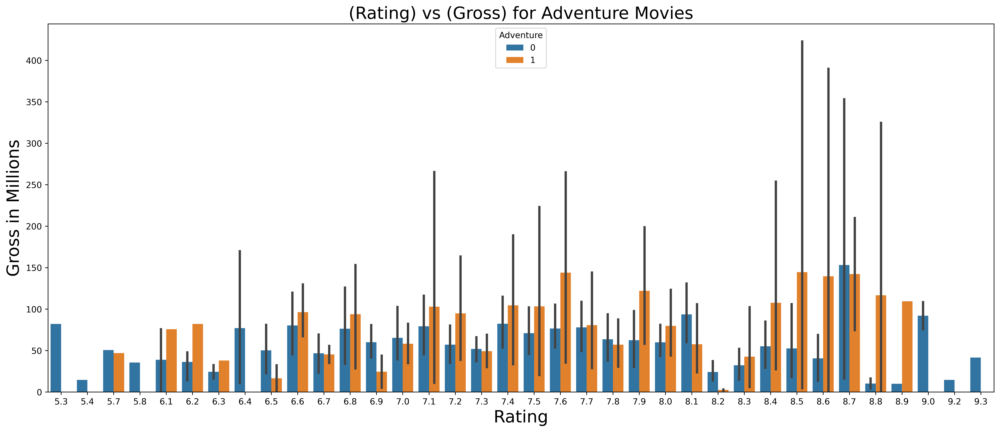

In [95]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Adventure')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Adventure Movies',fontsize=20);

### `From the above plot,Adventure Movies are with Highest Rating 7.6`

In [96]:
df[(df['Adventure']==1)&(df['Rating']==7.6)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
146,The Jungle Book,1967,78,"Animation, Adventure, Comedy",7.6,144903,80.25,0,0,0,0,1,0,0,0,1,0,0
309,Batoru rowaiaru,2000,114,"Action, Adventure, Drama",7.6,38940,35.51,1,0,1,0,0,0,0,0,1,0,0
321,Jûsan-nin no shikaku,2010,141,"Action, Adventure, Drama",7.6,202545,6.39,1,0,1,0,0,0,0,0,1,0,0
342,Dawn of the Planet of the Apes,2014,130,"Action, Adventure, Drama",7.6,1004214,422.78,1,0,1,0,0,0,0,0,1,0,0
559,Mad Max 2,1981,96,"Action, Adventure, Sci-Fi",7.6,29696,0.96,1,0,0,0,0,0,1,0,1,0,0
639,Sherlock Holmes,2009,128,"Action, Adventure, Mystery",7.6,537177,324.59,1,0,0,0,0,0,0,1,1,0,0
651,Die Hard: With a Vengeance,1995,128,"Action, Adventure, Thriller",7.6,121332,0.79,1,0,0,0,0,1,0,0,1,0,0
783,Fear and Loathing in Las Vegas,1998,118,"Adventure, Comedy, Drama",7.6,96809,34.60,0,0,1,0,1,0,0,0,1,0,0
893,Guardians of the Galaxy Vol. 2,2017,136,"Action, Adventure, Comedy",7.6,631854,389.81,1,0,0,0,1,0,0,0,1,0,0


---

# 10.RATINGS & GROSS IN MILLIONS FOR BIOGRAPHY MOVIES

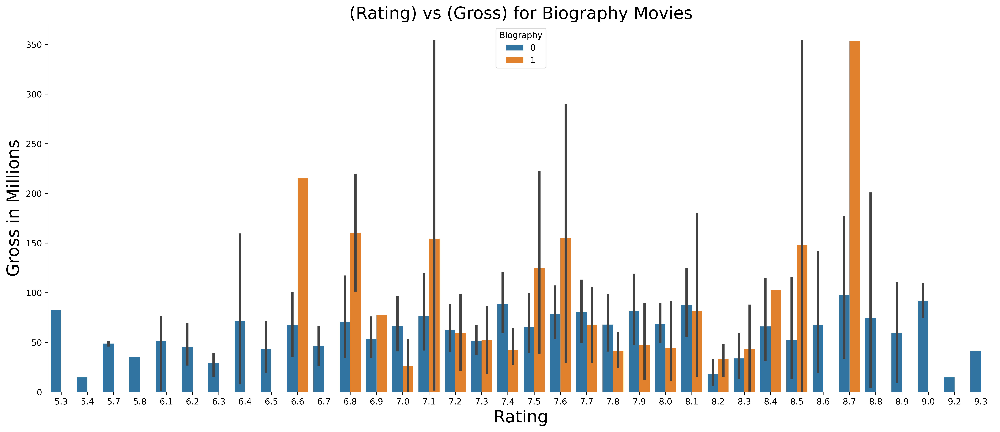

In [97]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Biography')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Biography Movies',fontsize=20);

### `From the above plot,Biography Movies are with Highest Rating 8.7`

In [98]:
df[(df['Biography']==1)&(df['Rating']==8.7)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
1,Goodfellas,1990,146,"Biography, Crime, Drama",8.7,379413,353.01,0,0,1,1,0,0,0,0,0,1,0


---

# 11.RATINGS & GROSS IN MILLIONS FOR WAR MOVIES

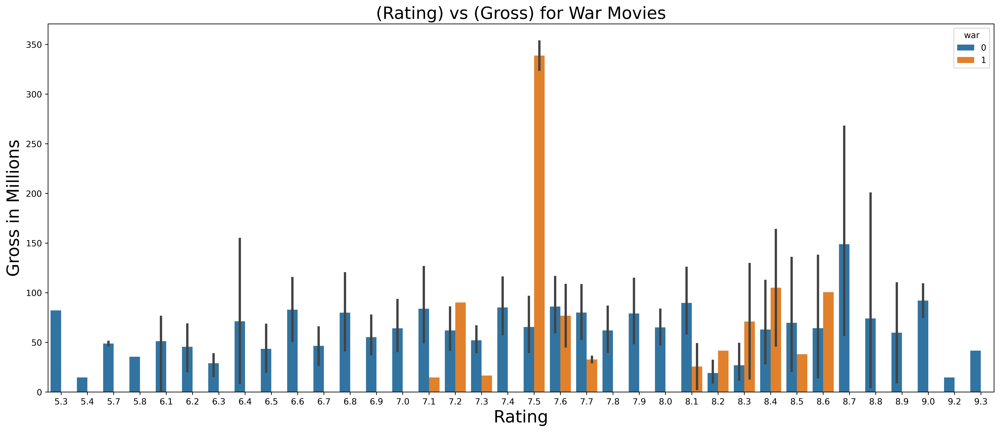

In [99]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='war')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for War Movies',fontsize=20);

### `From the above plot,War Movies are with Highest Rating 7.5`

### `And also from analysing we got to know that it is also a Drama Genre.`

In [100]:
df[(df['war']==1)&(df['Rating']==7.5)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
186,Fahrenheit 9/11,2004,122,"Documentary, Drama, War",7.5,537177,324.59,0,0,1,0,0,0,0,0,0,0,1
371,The Wind that Shakes the Barley,2006,127,"Drama, War",7.5,379413,353.01,0,0,1,0,0,0,0,0,0,0,1


---

## `From All Variate Plots We got to know the Gross collection for above Genres:`

## 1. Adventure = 82.81M
## 2. Action = 75.15M
## 3. Drama = 74.34M
## 4. Crime  = 69.80M
## 5. Comedy = 68.86M
## 6. Thriller = 60.95M
## 7. Mystery = 63.45M
## 8. Horror = 39.78M